<a href="https://colab.research.google.com/github/LBJ623XLF/RICH_x_YOLOv8/blob/main/RJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#!nvidia-smi
!pip install ultralytics
#from google.colab import drive
#drive.mount('/content/drive')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.0/887.0 kB 29.8 MB/s eta 0:00:00


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 171MB/s]


100%|██████████| 134k/134k [00:00<00:00, 14.7MB/s]


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 38.0ms
Speed: 14.2ms preprocess, 38.0ms inference, 762.8ms postprocess per image at shape (1, 3, 640, 480)


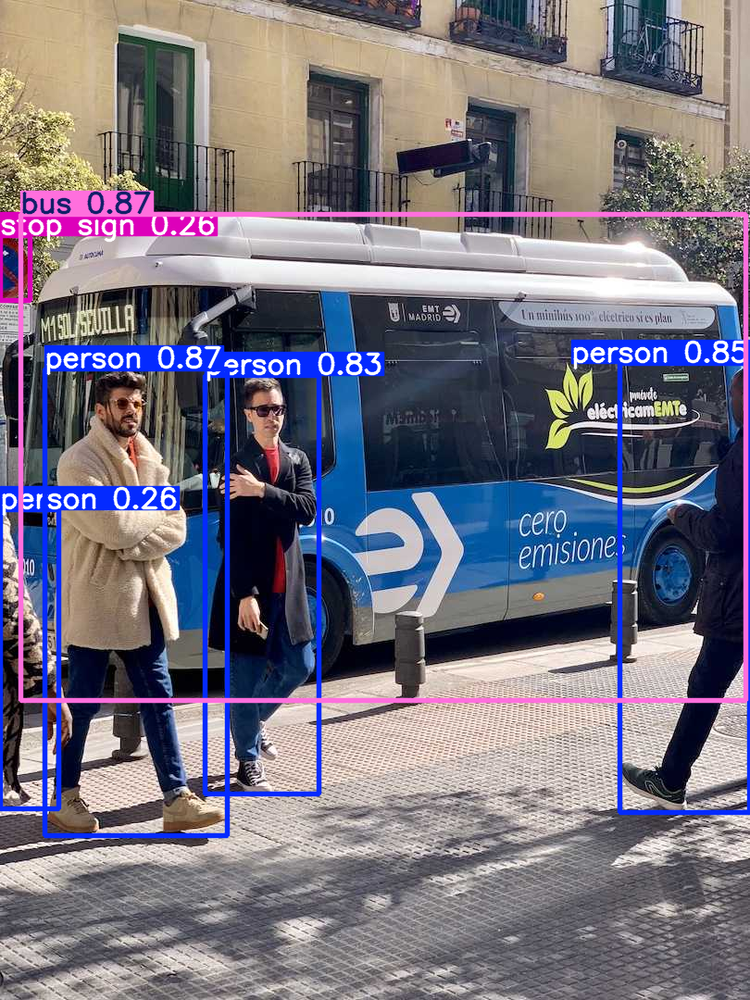

In [4]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')  # load a pretrained YOLO detection model
results = model('https://ultralytics.com/images/bus.jpg')  # predict on an image
results[0].show()

100%|██████████| 133M/133M [00:02<00:00, 67.9MB/s]


100%|██████████| 49.2k/49.2k [00:00<00:00, 17.5MB/s]


image 1/1 /content/zidane.jpg: 384x640 2 persons, 66.0ms
Speed: 1.6ms preprocess, 66.0ms inference, 41.1ms postprocess per image at shape (1, 3, 384, 640)


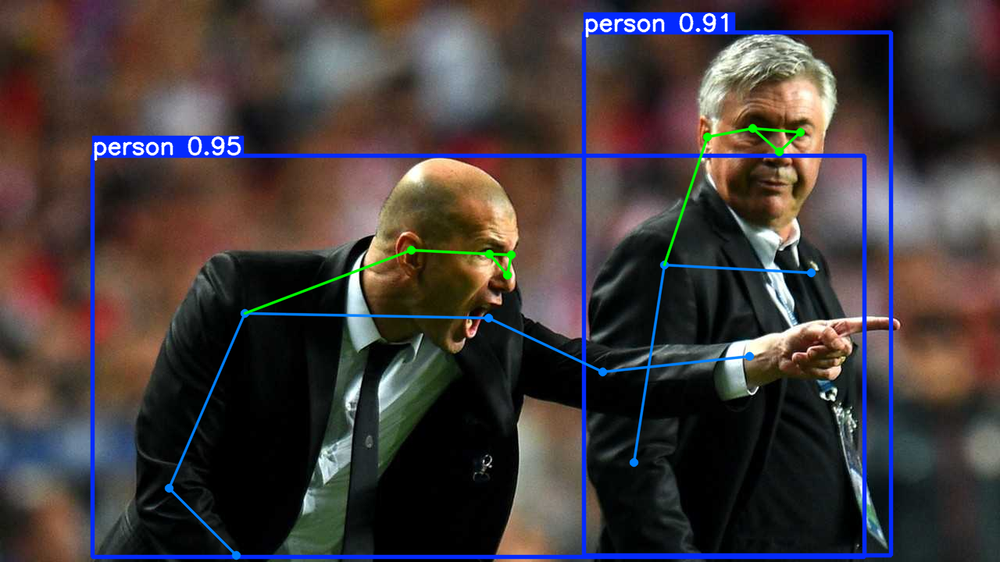

In [5]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
model = YOLO('yolov8x-pose.pt')  # load a pretrained YOLO detection model
results = model('https://ultralytics.com/images/zidane.jpg')  # predict on an image
results[0].show()

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="7idEzKSCpPKLTJwlUp3j")
project = rf.workspace("yolov11-midrp").project("hoi-gmd2i")
version = project.version(3)
dataset = version.download("yolov8")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.8 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to HOI-3 in yolov8:: 100%|██████████| 1332/1332 [00:00<00:00, 4657.26it/s]


In [7]:
!yolo task=detect mode=train model=yolov8n.pt data={dataset.location}/data.yaml epochs=20 imgsz=640

Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/HOI-3/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=T

In [8]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/HOI-3/valid/labels.cache... 45 images, 1 backgrounds, 0 corrupt: 100% 45/45 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:03<00:00,  1.01s/it]
                   all         45        166      0.909      0.642      0.773      0.538
             tooldrill          8          8      0.945          1      0.995      0.795
               toolgun         41         55      0.925        0.6        0.8      0.502
               toolham         29         41      0.856      0.244      0.446       0.28
               toolsaw         42         62      0.912      0.726      0.851      0.574
Speed: 10.6ms preprocess, 10.7ms inference, 0.0ms loss, 23.7ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultra

In [11]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images

Ultralytics 8.3.32 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs

image 1/43 /content/HOI-3/test/images/Sequence-02-00_19_45_03-Still004_png.rf.fc76fa13d516c99b6ef0e860ecbcdf31.jpg: 640x640 1 toolgun, 1 toolham, 2 toolsaws, 9.1ms
image 2/43 /content/HOI-3/test/images/Sequence-02-00_19_45_09-Still006_png.rf.830a978e08c76387ffc2099568c3f2ce.jpg: 640x640 1 toolgun, 2 toolhams, 2 toolsaws, 7.5ms
image 3/43 /content/HOI-3/test/images/Sequence-02-00_19_48_09-Still020_png.rf.db18ffb9be094c137d124eedbf9e8391.jpg: 640x640 1 toolgun, 1 toolsaw, 7.4ms
image 4/43 /content/HOI-3/test/images/Sequence-02-00_19_48_13-Still021_png.rf.d07886407a071f0ba288818950c0bc90.jpg: 640x640 1 toolsaw, 7.3ms
image 5/43 /content/HOI-3/test/images/Sequence-02-00_19_48_21-Still023_png.rf.7a6b4b8f89b3c1d405a64d5e8d391108.jpg: 640x640 1 toolgun, 1 toolsaw, 7.4ms
image 6/43 /content/HOI-3/test/images/Sequence-02-00_19_49_08-

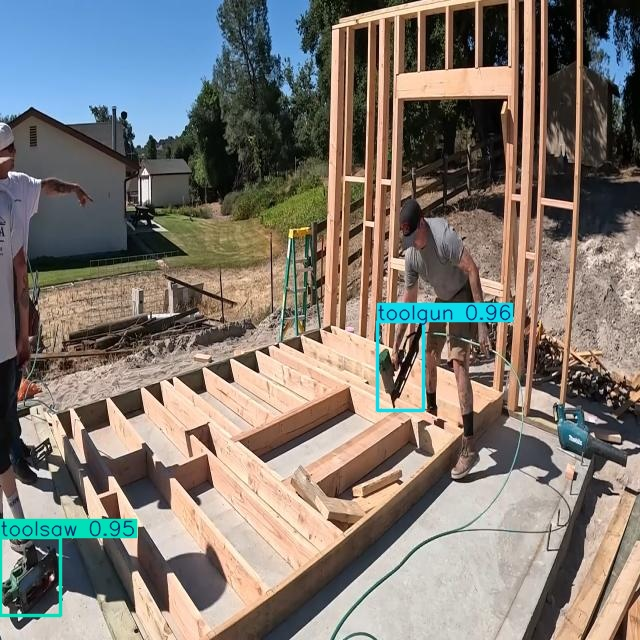

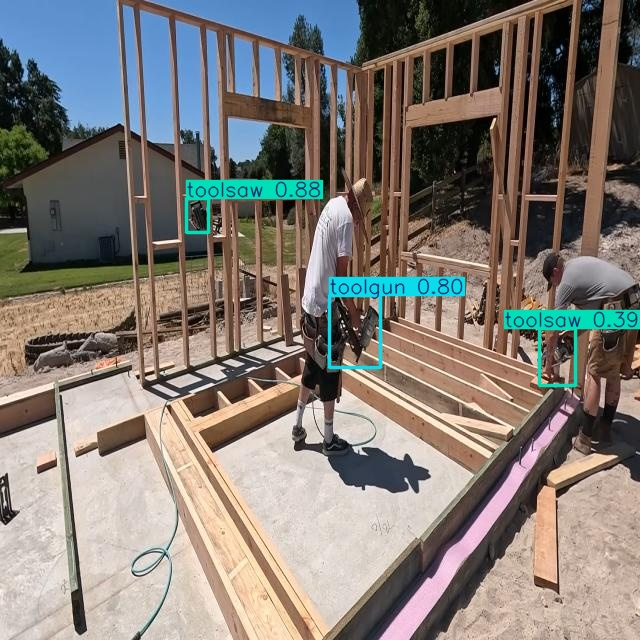

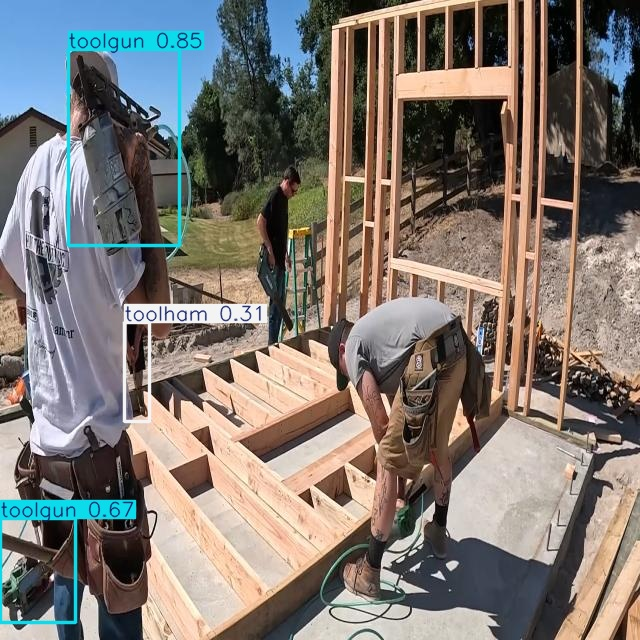

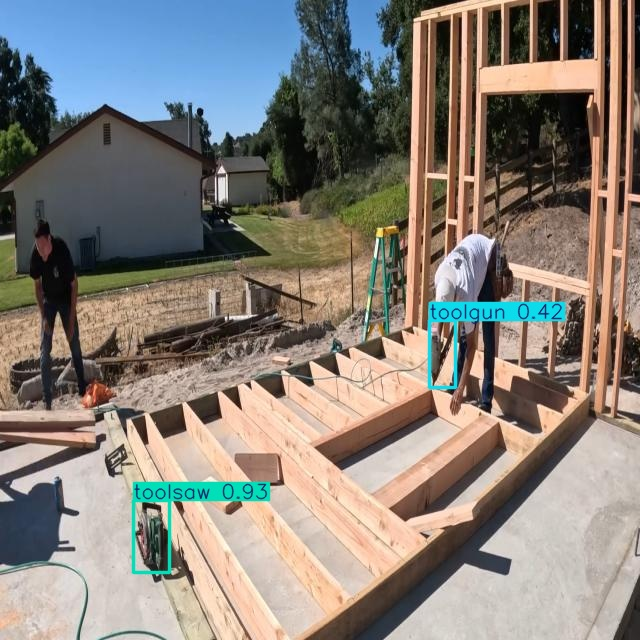

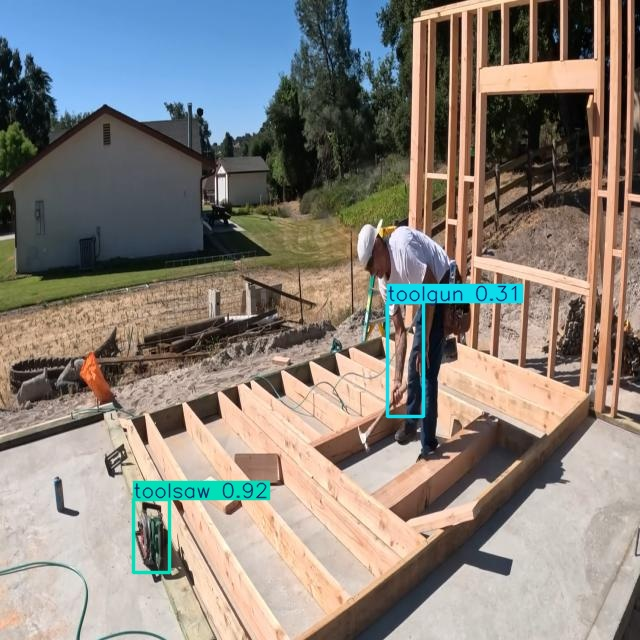

...

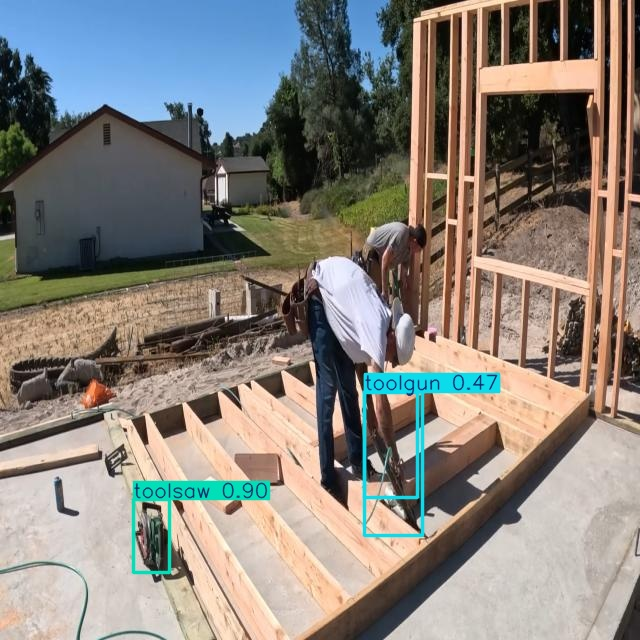

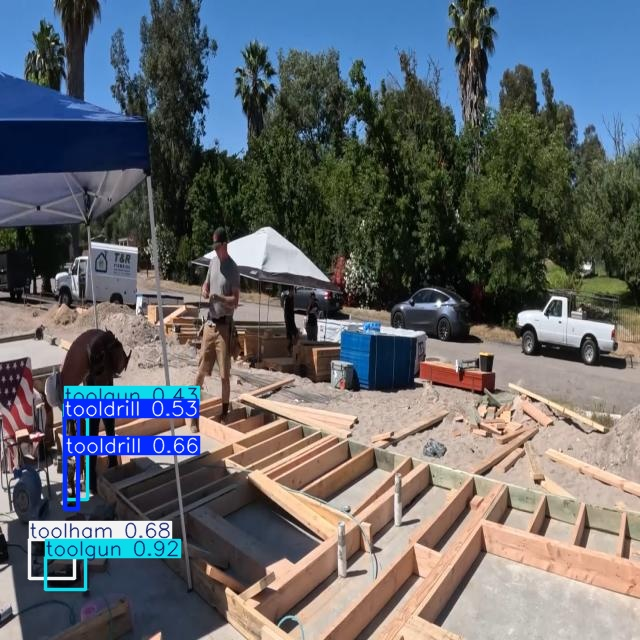

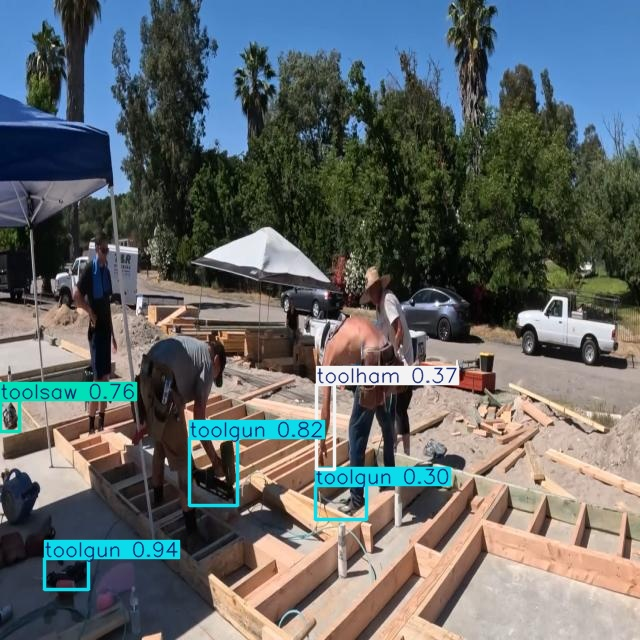

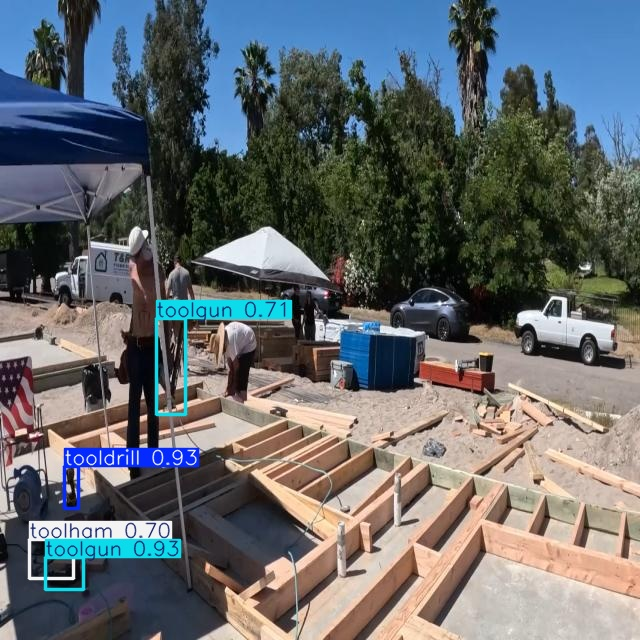

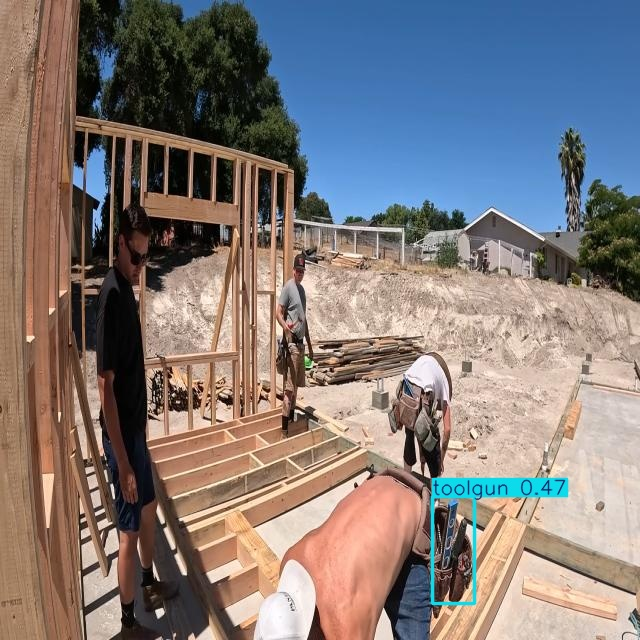

In [12]:
import glob
from IPython.display import Image, display
for imageName in glob.glob('/content/runs/detect/predict2/*.jpg'):
    display(Image(filename=imageName, height=600))
    print("\n")